In [1]:
%%javascript
require(['base/js/utils'],
function(utils) {
   utils.load_extensions('calico-spell-check', 'calico-document-tools', 'calico-cell-tools');
});

<IPython.core.display.Javascript object>

# Predict The Standings Of 18/19 Premiere League Base On Previous Data
---
## Abstract
In this project, a process of scrapping the data of premier league from 2005 to 2017 on https://www.transfermarkt.com/ is presented. The scrapped data are organised into a big DataFrame follow a clear naming convention. During the EDA, a correlation table and a multivariate plot demonstrate the potential correlation. A couple of machine learning techniques have performed on the data, trying to find the most reliable prediction. At meanwhile, the evaluation for each techniques are presented after prediction. Linear regression method under-fit the problem while non-linear regression methods have a high variance. **K Nearest Neighbours** 

## Introduction
The Premier League is an exciting English football league system. Nowadays, it is the most valuable football league system among the world, which 20 different clubs furiously fight each other for the champion and a ticket to the UEFA Champions league. The champion of the premier league is much unpredictable than other same level leagues due to the big investment to different clubs in the league.

The interest of predicting the standings for each clubs at the beginning of the season never stops. Not only the huge enthusiasm from the fans but also all the betting companies are focusing on this area. A successfully prediction can bring a big profits. However, this project is completely non-profit and any usage of the result of this project should be at your own risk. This project presents the process of scrapping resource from website and using regression and KNN to predict the standings base on the market values of a club.

In [1]:
# imports
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
import seaborn as sns
from pylab import rcParams

sns.set(style="ticks")
sns.set_style("whitegrid")
rcParams['figure.dpi'] = 350
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['patch.edgecolor'] = 'white'
rcParams['font.family'] = 'StixGeneral'
rcParams['font.size'] = 20
rcParams['figure.figsize'] = (10,10)
rcParams['axes.labelsize'] = 'large'
rcParams['xtick.labelsize'] = 20
rcParams['ytick.labelsize'] = 20

## Scrap The Web Page
---
In order to increase the readability of this notebook, the web scrapping process is written in the `web_scrapper` class and imported to this notebook. It scraps the summary and standings tables from https://www.transfermarkt.com/premier-league/startseite/wettbewerb/GB1/plus/?saison_id=2017 in the range between 2005 to 2017 and convert merge it to a giant dictionary with the year as the key and the summary detail of premier league in that year as the value.

In [3]:
from web_scrapper import web_scrapper

In [4]:
my_web_scrapper = web_scrapper()
try:
    my_web_scrapper.connect()
except requests.ConnectionError as detail:
    print(detail)

Request Succeeded!


In [5]:
summary_dfs = my_web_scrapper.digest()

In [6]:
summary_dfs[2005].head(3)

,Avg. Market Values,Avg. Player age,Club Full Name,Club Short Name,Total Market Values,Position,Goal Difference,Points
0,"13,04 Mill. €","24,5",Chelsea FC,Chelsea,"352,18 Mill. €",1,50,91
1,"9,89 Mill. €","24,9",Manchester United,Man Utd,"286,93 Mill. €",2,38,83
2,"6,63 Mill. €","23,3",Arsenal FC,Arsenal,"218,95 Mill. €",4,37,67


## Scrap The Web API
---
If the website has an available API will make your live much easier than you scrapping from the raw HTML. Since the website we primary look into doesn't have an API, we found a website https://www.apify.com/ which can crawl https://www.transfermarkt.com/ and generate a json format API.

**_Note: Since I didn't subscribe a membership on that website their API link might become invalid when my free account expired_**

In [7]:
import json

In [8]:
url = "https://api.apify.com/v1/SyD5kRQyDutSTR8LD/crawlers/ibPK3eJzvSBQis4fP/lastExec/results?token=zedtBuCoYTJfpgMrx5BQmErPm"
response = requests.get(url)
if response.status_code != 200:
    print("Oops, cannot connect to the API, check if the membership of that website expired")

In [9]:
response_json = response.content
players_18_dict = json.loads(response.content)

Organise the json format and store it into a DataFrame

In [10]:
players_18_df = pd.DataFrame()
for record in players_18_dict:
    players_18_df = players_18_df.append(record["pageFunctionResult"], ignore_index=True)

In [11]:
players_18_df.columns

Index([u'Age', u'Contract until', u'Current club', u'Date of Birth',
       u'Date of last contract extension', u'Facebook', u'Foot', u'Full Name',
       u'Height', u'Instagram', u'Joined', u'Name', u'Nationality', u'Photo',
       u'Place of Birth', u'Player agents', u'Position', u'Twitter',
       u'currentMarketValue', u'jerseyNumber',
       u'Name in Home Country /\nFull Name', u'Outfitter', u'Website',
       u'Google+', u'Contract option', u'2nd club', u'Shoe model',
       u'Contract there until', u'Loan club', u'Twitter-Hashtag',
       u'Shoe size'],
      dtype='object')

## Prepare The Data
---
As we see above in the table, the data scrapped from https://www.transfermarkt.com are in good shape. However, we have to clean this data for machine learning's sake since model will only accept numeric inputs.

In [12]:
big_summary_df = pd.DataFrame()
for key, df in summary_dfs.items():
    df["Year"] = key
    big_summary_df = pd.concat((big_summary_df, df))

In [13]:
big_summary_df.reset_index(drop=True, inplace=True)
big_summary_df.tail(3)

,Avg. Market Values,Avg. Player age,Club Full Name,Club Short Name,Total Market Values,Position,Goal Difference,Points,Year
277,"2,53 Mill. €","25,6",Norwich City,Norwich,"103,75 Mill. €",19,-28,34,2015
278,"2,61 Mill. €","25,9",Leicester City,Leicester,"91,25 Mill. €",1,32,81,2015
279,"1,39 Mill. €","24,1",AFC Bournemouth,Bournemouth,"68,03 Mill. €",16,-22,42,2015


For the sake of readability, we can use a helper class which helps us to move the unit of both "Avg. Market Values" and "Total Market Values" to the column names. Then it can change all the cells that are numeric values to a proper data type.

In [14]:
from df_cleaner import df_cleaner

The `df_cleaner` class will perform the data integrity checking as well. Especially in `Avg. Market Values` and `Total Market Values` columns, there are rows that use different units, for example billion and thousand which needs to be converted to million.

In [15]:
my_df_cleaner = df_cleaner()
numeric_big_summary_df = my_df_cleaner.cook(big_summary_df)
numeric_big_summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 280 entries, 0 to 279
Data columns (total 9 columns):
Avg. Market Values(Mill. €)     280 non-null float64
Avg. Player age                 280 non-null float64
Club Full Name                  280 non-null object
Club Short Name                 280 non-null object
Total Market Values(Mill. €)    280 non-null float64
Position                        280 non-null int64
Goal Difference                 280 non-null int64
Points                          280 non-null int64
Year                            280 non-null int64
dtypes: float64(3), int64(4), object(2)
memory usage: 19.8+ KB


In [16]:
numeric_big_summary_df.head(3)

,Avg. Market Values(Mill. €),Avg. Player age,Club Full Name,Club Short Name,Total Market Values(Mill. €),Position,Goal Difference,Points,Year
0,14.12,24.7,Manchester City,Man City,621.40,3,41,78,2016
1,12.31,23.8,Chelsea FC,Chelsea,603.30,1,52,93,2016
2,12.70,23.5,Manchester United,Man Utd,533.25,6,25,69,2016


## EDA
---
Before we feed the data to the model, it is important that we can analyse the data both visually and numerically first. It will give us more intuition of the problem we are trying to solve.

In [17]:
def color_strong_corr_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for strong correlations
    , black otherwise.
    """
    color = 'red' if (val > 0.6 or val < -0.6)  else 'black'
    return 'color: %s' % color

As the correlation table will be most intuitive, we can take a look which two numeric features have a strong correlation.

In [18]:
numeric_big_summary_df.corr().style.applymap(color_strong_corr_red)

,Avg. Market Values(Mill. €),Avg. Player age,Total Market Values(Mill. €),Position,Goal Difference,Points,Year
Avg. Market Values(Mill. €),1,-0.0125016,0.96082,-0.559806,0.559261,0.160677,0.371989
Avg. Player age,-0.0125016,1,-0.146112,0.293966,-0.309575,-0.495778,0.176956
Total Market Values(Mill. €),0.96082,-0.146112,1,-0.611241,0.617633,0.285399,0.403267
Position,-0.559806,0.293966,-0.611241,1,-0.900655,-0.736599,0
Goal Difference,0.559261,-0.309575,0.617633,-0.900655,1,0.769066,0
Points,0.160677,-0.495778,0.285399,-0.736599,0.769066,1,-0.271716
Year,0.371989,0.176956,0.403267,0,0,-0.271716,1


We can see that total market values of a club has a relationship with both position and goal difference. Let's visualise this relationship.

In [19]:
g = sns.PairGrid(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, :-1], height=5)
g = g.map_upper(plt.scatter)
g = g.map_lower(sns.kdeplot)
g = g.map_diag(sns.kdeplot)

From the histogram of each feature we can tell that `average market values` might have a good potential to be a good predictor for `goal difference`, `points` and `position`. `Total market values` has the same property, while the histogram of total market values is less intuitive in grid plots. 

## Data Transform
---
It might worths the efforts to make the average market values more normal distributed to make regression stage efficient.

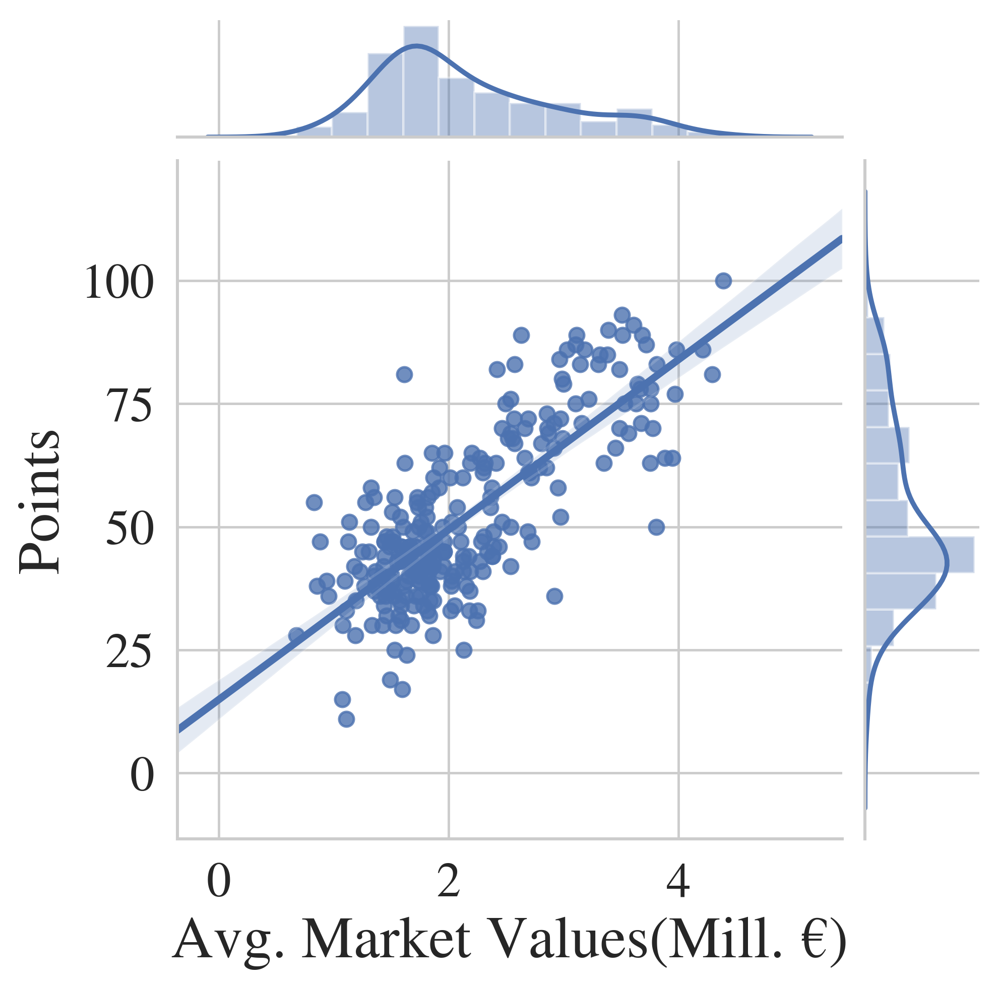

In [27]:
sns.jointplot(
    x=np.sqrt(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, 0] ),
    y=numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, -2], kind="reg",
             )

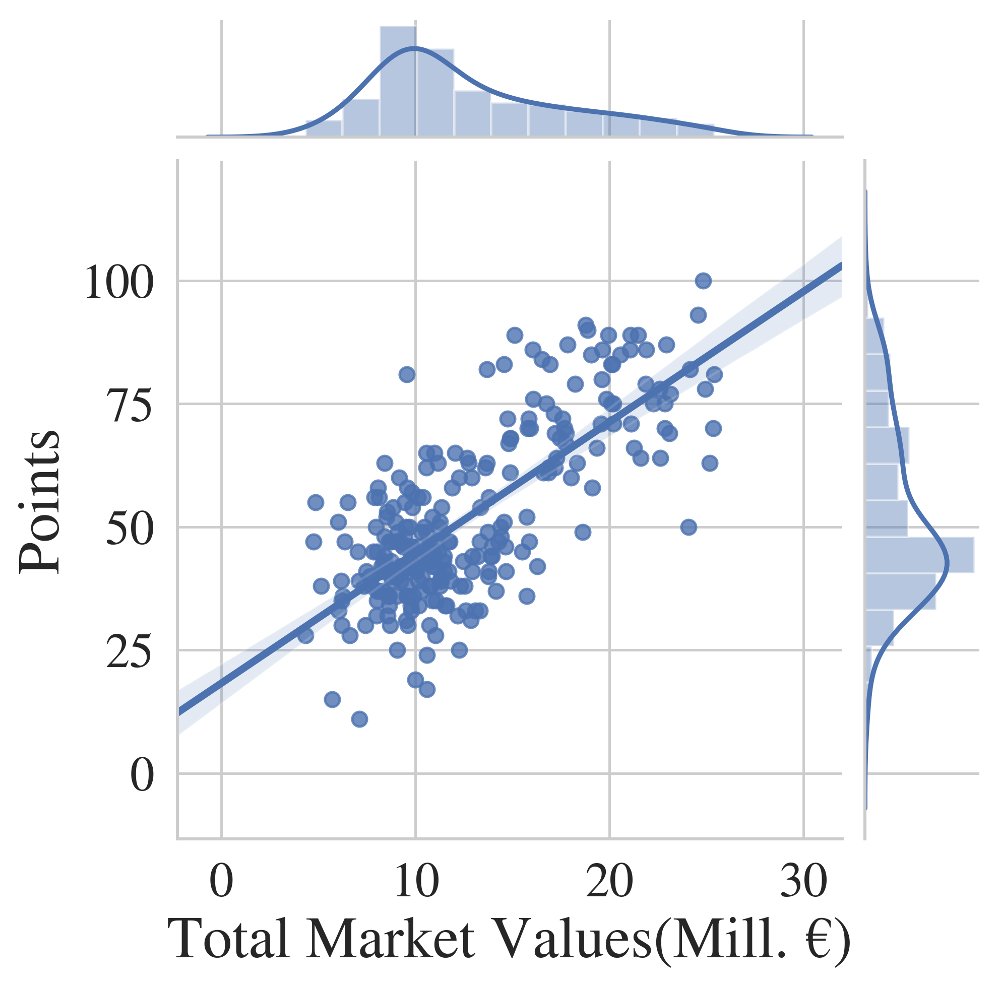

In [21]:
sns.jointplot(
    x=np.sqrt(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, 4] ),
    y=numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, -2], kind="reg",
             )

## Training and Testing
---
Before regression, we need a mechanism to help us evaluating our prediction result. Thus, we need to split the dataset into training set and testing set.

Firstly, for convenience, the training set and test set will use abbreviated column names. However, for readability, plotting will still use the full name DataFrame 

In [102]:
training_set_df = numeric_big_summary_df.copy()

old_col_name_list = training_set_df.columns
training_set_df.rename(columns={
    old_col_name_list[0]: "avg_mv",
    old_col_name_list[1]: "avg_age",
    old_col_name_list[2]: "full",
    old_col_name_list[3]: "short",
    old_col_name_list[4]: "total_mv",
    old_col_name_list[5]: "pos",
    old_col_name_list[6]: "gd",
    old_col_name_list[7]: "pts",
    old_col_name_list[8]: "year",
}, inplace=True)

we need to split the 2018 year dataset since this is our objective in this project, to predict the standing of this year.

In [103]:
prediction_input_df = training_set_df[training_set_df["year"] == 2018]
training_set_df.drop(prediction_input_df.index, axis=0, inplace=True)

Secondly, the dataset need to be split to training set and testing set. The radio of training set is 80% and of testing set is 20%.

In [104]:
testing_set_df = training_set_df.sample(frac=0.2)
training_set_df.drop(testing_set_df.index, axis=0, inplace=True)

Take a look what two sets look like

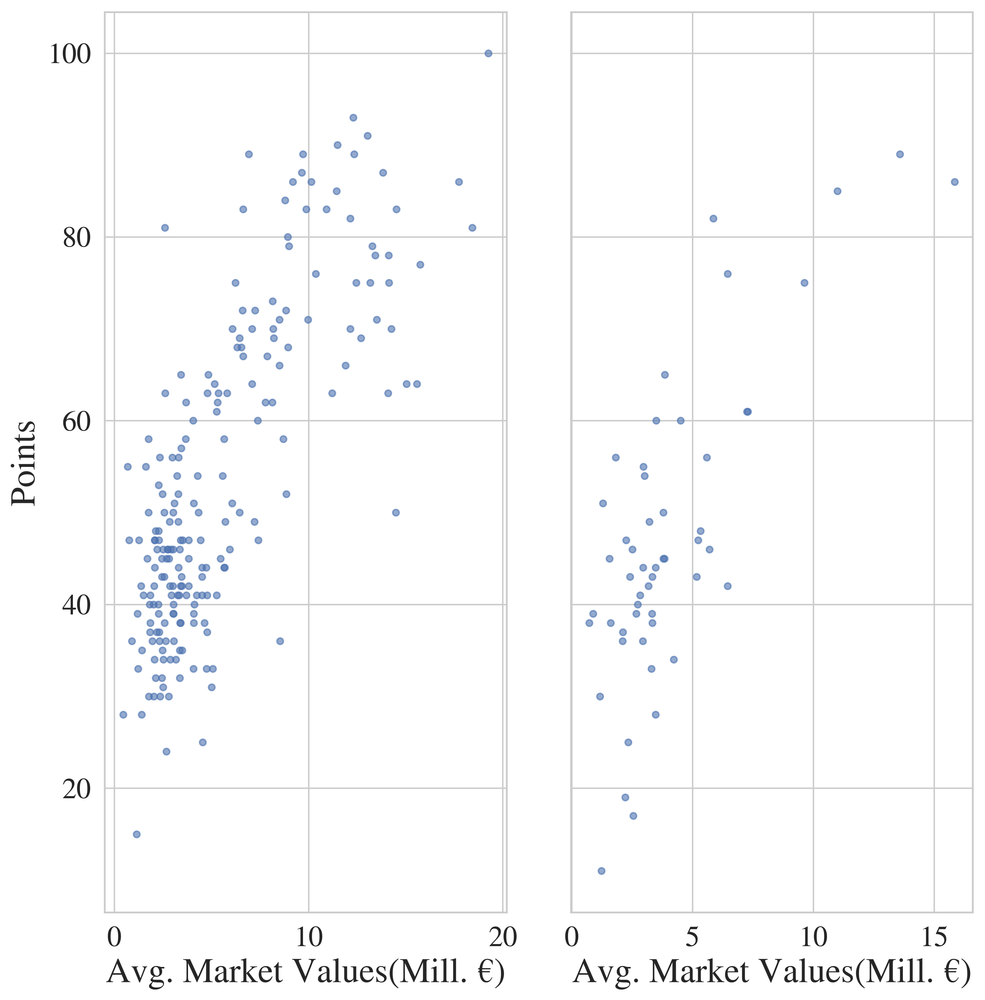

In [105]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.scatter(training_set_df.avg_mv, training_set_df.pts, s=20, alpha=0.6)
ax1.set_xlabel(numeric_big_summary_df.columns[0])
ax1.set_ylabel("Points")
ax2.scatter(testing_set_df.avg_mv, testing_set_df.pts, s=20, alpha=0.6)
ax2.set_xlabel(numeric_big_summary_df.columns[0])
fig.tight_layout()

## Inputs Normalisation
---
Market value inflation rate will disturb the predictions of the models. As the big investments into the premier league, the total market values of whole league booms each year.

Text(0,0.5,'Million Euro')

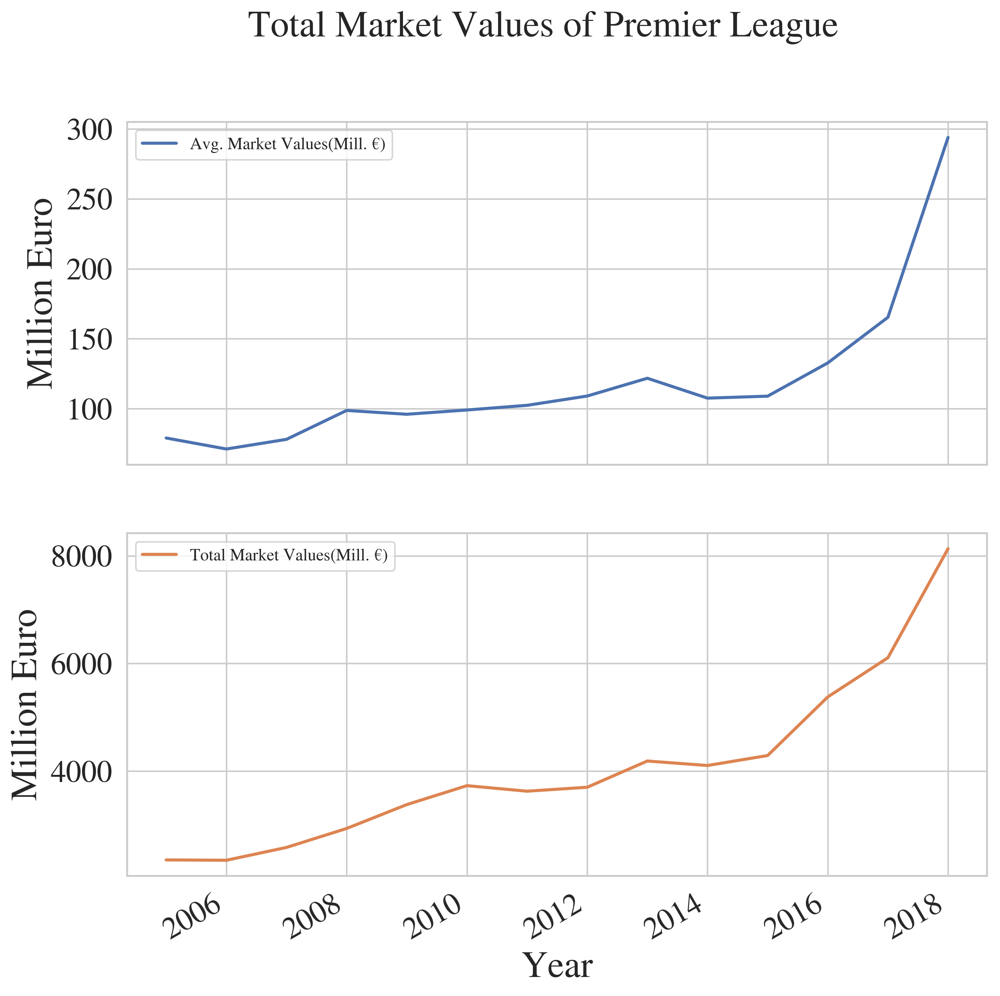

In [106]:
axes = numeric_big_summary_df.iloc[:, [0, 4, -1]].groupby("Year").sum().plot(subplots=True, title="Total Market Values of Premier League")
axes[0].set_ylabel("Million Euro")
axes[1].set_ylabel("Million Euro")

The market values of league increased steadily overall on both total and average values before 2015. Both values accelerated after 2015 and rocketed by almost 100% by now. This will confuse the models since the points and standings of league remain the same.

In [107]:
top_3_comparison_df = pd.concat((numeric_big_summary_df[numeric_big_summary_df["Year"] == 2005].head(3), numeric_big_summary_df[numeric_big_summary_df["Year"] == 2018].head(3)))

tail_3_comparison_df = pd.concat((numeric_big_summary_df[numeric_big_summary_df["Year"] == 2005].tail(3), numeric_big_summary_df[numeric_big_summary_df["Year"] == 2018].tail(3)))

combined_comparison_df = pd.concat((top_3_comparison_df, tail_3_comparison_df))

Text(0.5,1,'Top Three and Bottom Three Clubs Total Market Values in Different Years')

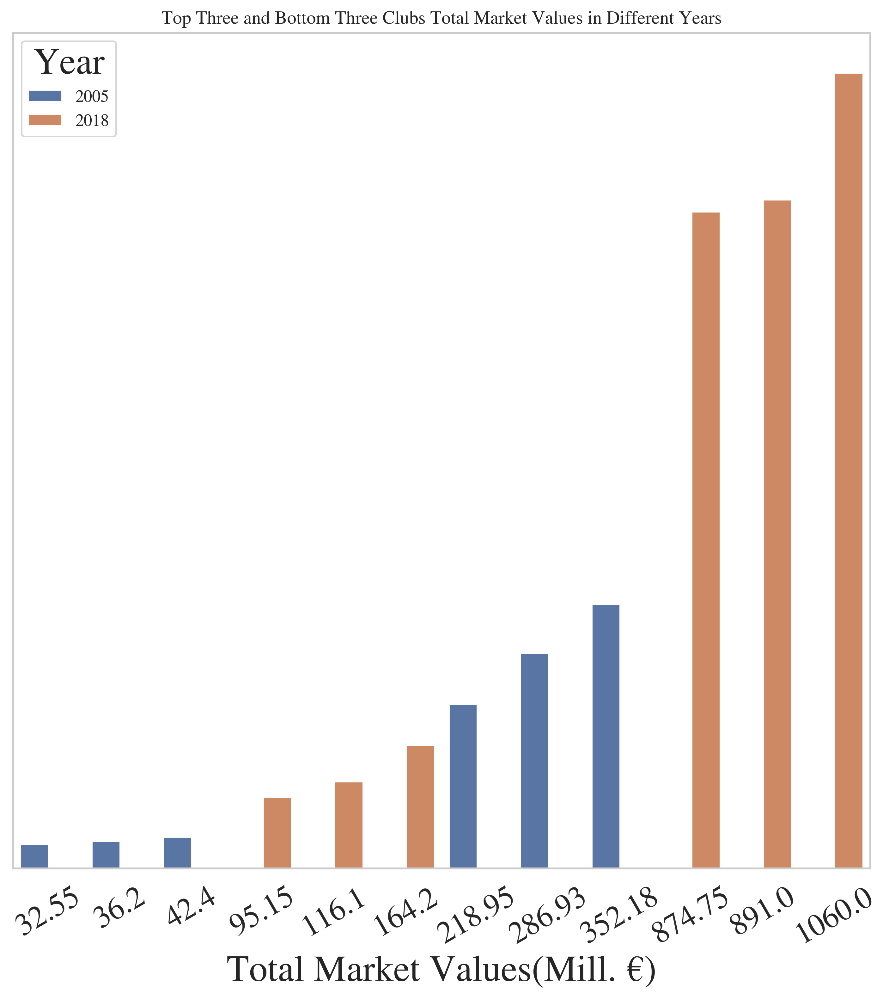

In [108]:
ax = sns.barplot(y=combined_comparison_df.iloc[:, 4], x=combined_comparison_df.iloc[:, 4], hue="Year", data=combined_comparison_df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
ax.set_yticklabels([])
ax.set_ylabel("")
ax.grid(False)
ax.set_title("Top Three and Bottom Three Clubs Total Market Values in Different Years")

Above bar plot demonstrates in 2005 and 2018 the top three and bottom three total market values. It is clear to see that the total market values of the first among the bottom three clubs in 2018 is not far from the third highest valuable club in 2005. If we use a linear predictor, it will give the approximation that the 164.2 million euro club will do almost as good as the 218.95 million euro club in 2005, which dosen't make any sense. Also, the 1060 million euro worth club will not gain three times more points than the most valuable club in 2005, since the points a club can win has a limit.

### Normalisaiton Formula
To tackle the issue we describe above, a straightforward way is to normalise the inputs.

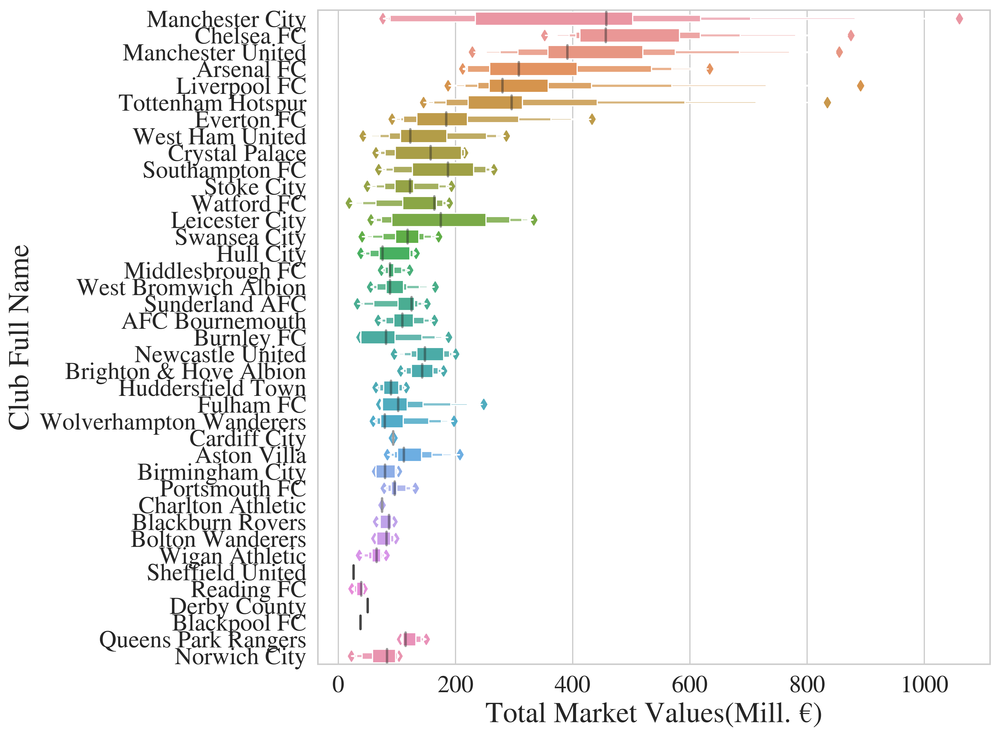

In [110]:
ax = sns.boxenplot(x=numeric_big_summary_df.iloc[:, 4], y=numeric_big_summary_df.iloc[:, 2])

In [111]:
from sklearn import preprocessing

In [202]:
norm_training_set_df = training_set_df.copy()

In [203]:
year_mean_df = norm_training_set_df.groupby("year").mean()[["avg_mv", "total_mv"]]

In [204]:
year_std_df = norm_training_set_df.groupby("year").std()[["avg_mv", "total_mv"]]

In [219]:
def normalise(x):
    x["avg_mv"] = (x["avg_mv"] - year_mean_df.loc[x["year"], "avg_mv"]) / year_std_df.loc[x["year"], "avg_mv"]
    x["total_mv"] = (x["total_mv"] - year_mean_df.loc[x["year"], "total_mv"]) / year_std_df.loc[x["year"], "total_mv"]
    return x
     

In [222]:
norm_training_set_df.apply(normalise, axis=1)

,avg_mv,avg_age,full,short,total_mv,pos,gd,pts,year
0,1.763555,24.7,Manchester City,Man City,1.822118,3,41,78,2016
1,1.313675,23.8,Chelsea FC,Chelsea,1.723681,1,52,93,2016
2,1.410610,23.5,Manchester United,Man Utd,1.342713,6,25,69,2016
3,1.348472,23.7,Arsenal FC,Arsenal,1.285608,5,33,75,2016
4,0.831482,23.4,Liverpool FC,Liverpool,0.586215,4,36,76,2016
5,0.774315,22.7,Tottenham Hotspur,Spurs,0.539172,2,60,86,2016
7,-0.386426,23.7,West Ham United,West Ham,-0.247891,11,-17,45,2016
8,-0.555442,25.1,Crystal Palace,Crystal Palace,-0.384289,14,-13,41,2016
9,-0.267121,24.4,Southampton FC,Southampton,-0.392175,8,-7,46,2016
10,-0.334230,26.1,Stoke City,Stoke City,-0.506384,13,-15,44,2016


In [212]:
norm_training_set_df

,avg_mv,avg_age,full,short,total_mv,pos,gd,pts,year
0,14.12,24.7,Manchester City,Man City,621.40,3,41,78,2016
1,12.31,23.8,Chelsea FC,Chelsea,603.30,1,52,93,2016
2,12.70,23.5,Manchester United,Man Utd,533.25,6,25,69,2016
3,12.45,23.7,Arsenal FC,Arsenal,522.75,5,33,75,2016
4,10.37,23.4,Liverpool FC,Liverpool,394.15,4,36,76,2016
5,10.14,22.7,Tottenham Hotspur,Spurs,385.50,2,60,86,2016
7,5.47,23.7,West Ham United,West Ham,240.78,11,-17,45,2016
8,4.79,25.1,Crystal Palace,Crystal Palace,215.70,14,-13,41,2016
9,5.95,24.4,Southampton FC,Southampton,214.25,8,-7,46,2016
10,5.68,26.1,Stoke City,Stoke City,193.25,13,-15,44,2016


## Linear Regression
---
Firstly, let's use a linear hypothesis function to describe the relationship, and evaluate the performance.

In [21]:
from ml_agent import linear_agent

It will be more intuitive for use to evaluate how good is our model to use a one-number evaluation.
To achieve this objective, we can calculate the square mean difference for the test set and prediction, the smaller the loss is, the better the model can predict.

$$
loss = \sum_{i=1}^{n} (y_i - h(x_i))^2
$$

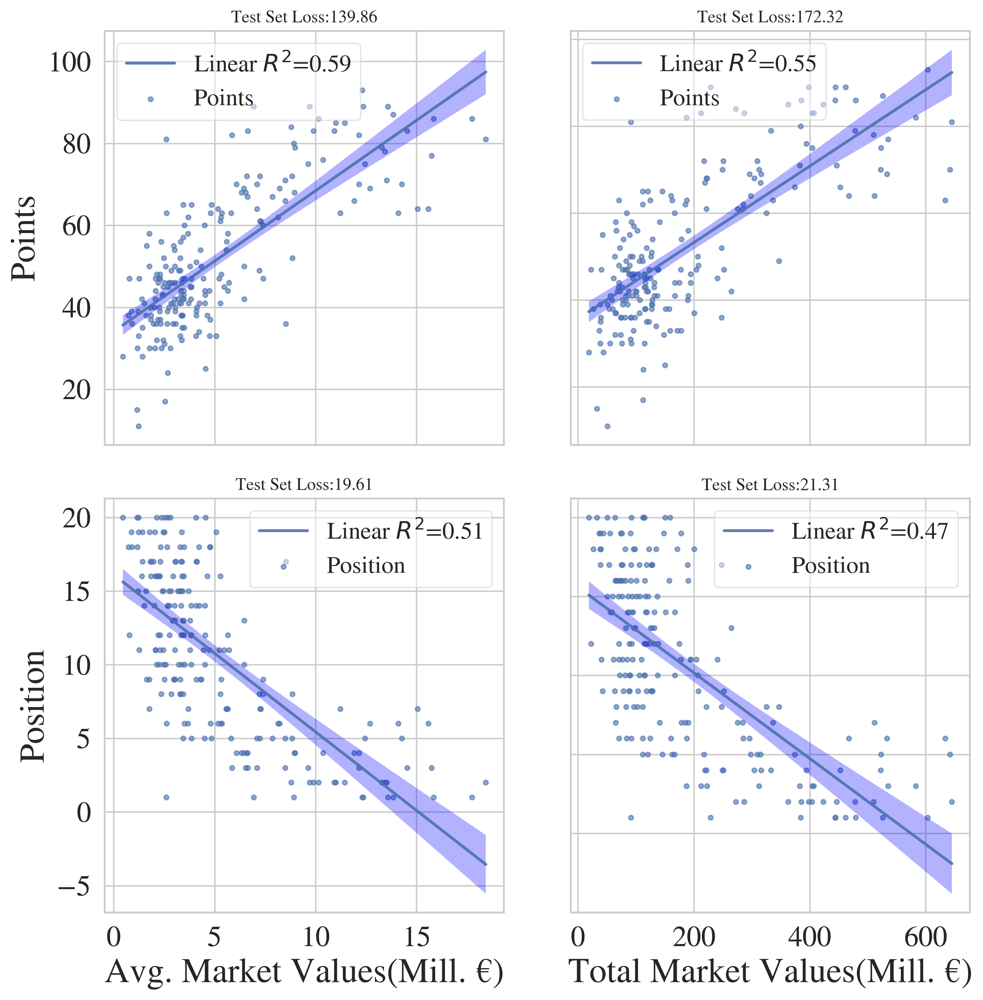

In [22]:
my_linear_agent = linear_agent(confidence=0.95)
my_linear_agent.train(train_data=training_set_df)
my_linear_agent.evaluate(train_data=training_set_df, test_data=testing_set_df, col_names=numeric_big_summary_df.columns)

From above plots we can observe that average market values is more accurate to predict. However, from the plots, intuitively we can see the linear hypothesis function is not confident enough for the training set. Will non-linear hypothesis function have a better performance to solve this problem? 

In [23]:
linear_prediction_df = my_linear_agent.predict(prediction_input_df)
linear_prediction_df.head(4)

Linear Model                               \
                  Avg. Market Values: Points Avg. Market Values: Position   
Manchester City                   174.111827                   -27.372541   
Liverpool FC                      143.427873                   -17.843193   
Chelsea FC                        131.058082                   -14.001574   
Manchester United                 147.070089                   -18.974336   

                                                                             
                  Total Market Values: Points Total Market Values: Position  
Manchester City                    128.830393                    -13.180630  
Liverpool FC                       113.980252                     -8.593659  
Chelsea FC                         112.552354                     -8.152604  
Manchester United                  110.816909                     -7.616553

Obviously, we have a couple of issues with linear model:
1. Data set has a more than linear relationship, the model is under-fitting the data set.
2. The market values are increasing overall, however, the points will not increase accordingly. There is a celling for the points a club can gain for whole season, which a club needs to win 38 games to gain 114 points at most. However, in this model, 2018 season prediction is clearly over-estimated.

## Non-linear Regression
---
### Polynomial n=2

In [24]:
from ml_agent import poly_2_agent

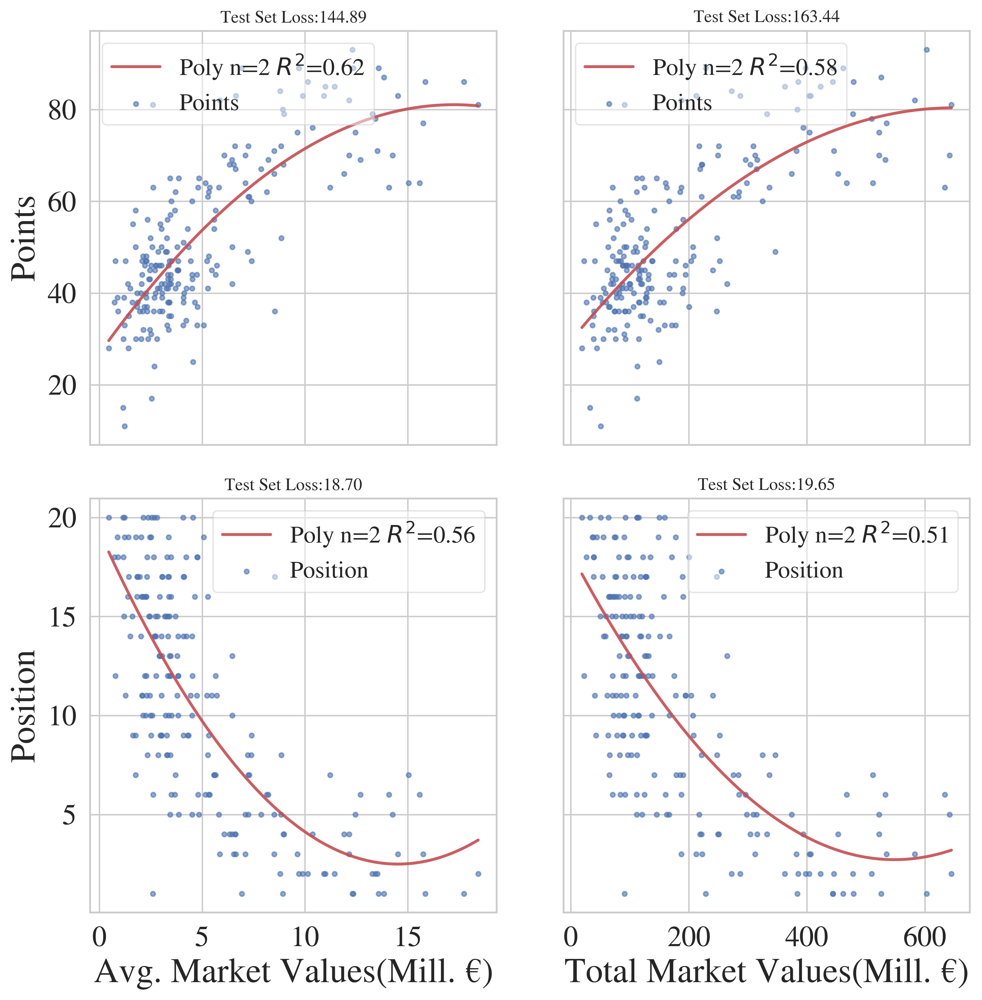

In [25]:
my_poly_2_agent = poly_2_agent()
my_poly_2_agent = poly_2_agent()
my_poly_2_agent.train(train_data=training_set_df)
my_poly_2_agent.evaluate(train_data=training_set_df, test_data=testing_set_df, col_names=numeric_big_summary_df.columns)

From the test set loss evaluation we can tell that a non-linear formula can describe the dataset better, specially on position prediction. The **$R^2$** has a **8.9%** increase on the average market values and position combination. Also the test set loss drops **2.1%** on average market values with position prediction.

Combined with the linear prediction, we can have a conclusion that compared with total market values, average market values has a better correlation with both points and position.

In [26]:
poly_prediction_df = my_poly_2_agent.predict(prediction_input_df)
poly_prediction_df.head(4)

Polynomial Degree 2                               \
                  Avg. Market Values: Points Avg. Market Values: Position   
Manchester City                   -19.627935                    57.251416   
Liverpool FC                       42.341501                    26.310515   
Chelsea FC                         59.101384                    17.428528   
Manchester United                  36.506267                    29.319045   

                                                                             
                  Total Market Values: Points Total Market Values: Position  
Manchester City                     59.963167                     16.168955  
Liverpool FC                        73.282941                      8.750573  
Chelsea FC                          74.200614                      8.192001  
Manchester United                   75.230185                      7.549668

### Different Polynomial Degree

In [27]:
from ml_agent import non_linear_agent

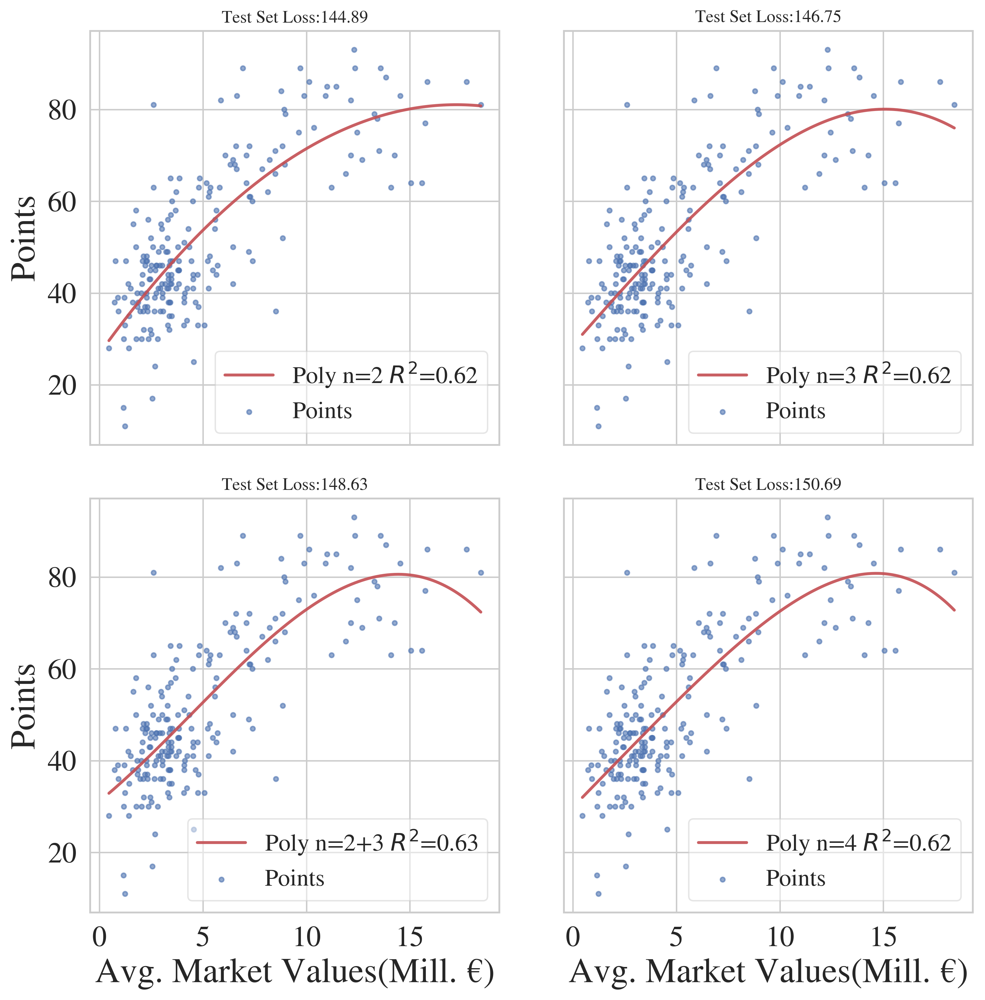

In [28]:
my_non_linear_agent = non_linear_agent()
my_non_linear_agent.train(train_data=training_set_df)
my_non_linear_agent.evaluate(train_data=training_set_df, test_data=testing_set_df,
                             col_names=numeric_big_summary_df.columns)

The Different polynomial degree dosen't affect the performance much. However, judging from the plots, high degree polynomial hypothesis function seems suffer from the over-fitting problem.

In [29]:
non_linear_prediction = my_non_linear_agent.predict(prediction_input_df)
non_linear_prediction.head(4)

Non-linear Model                        \
                  Polynomial Degree 2 Polynomial Degree 2+3   
Manchester City            -19.627935           -512.654674   
Liverpool FC                42.341501           -137.212718   
Chelsea FC                  59.101384            -45.914251   
Manchester United           36.506267           -170.079814   

                                                           
                  Polynomial Degree 3 Polynomial Degree 4  
Manchester City           -270.324386         -797.066185  
Liverpool FC               -50.190605         -200.305270  
Chelsea FC                   4.464497          -72.959417  
Manchester United          -69.724932         -248.286615

The prediction is not convincing enough for the real situation even for the polynomial with degree of 2. A negative points demonstrates the model suffers the over-fitting problem just like we inferred on plots observation. 

## K Nearest Neighbour
---
